This Notebook enables more visualization of the 3 trees (E13, E16, G3) after recomputation of the missing radiuses and leaf numbers. The model "visual model" was created only to see quickly the 3D representations of these trees, without calculations in the background.

In [2]:
import numpy as np
import pandas as pd
import igraph as ig
from importlib import resources
import vmlab

In [3]:
from scipy.sparse import csgraph
import matplotlib.pyplot as plt

In [4]:
from vmlab.models import visual_model

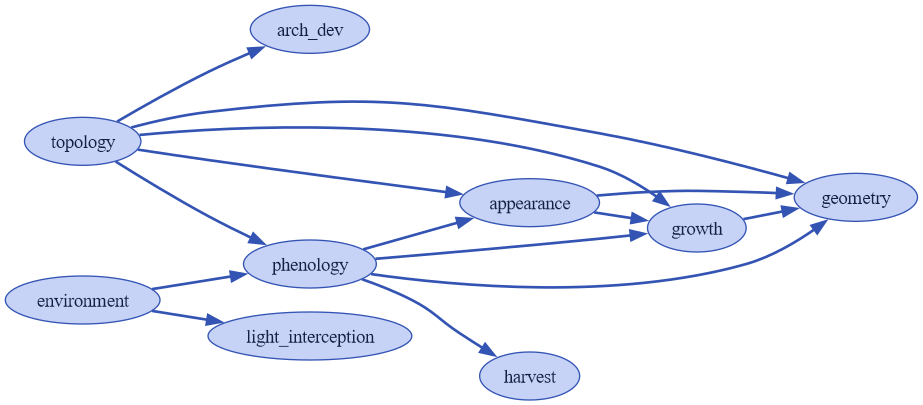

In [5]:
visual_model.visualize()

## Some visualisation of tree structures with igraph

The orange GUs bear at least one fruit, and the green ones at leats one leaf. The purple GUs are "branches", the pink ones are "branches empty" , the grey ones are "undefined"or "multiple GUs".

In [6]:
sunlit_fractions_file_path_E13 = resources.path('vmlab.data.environment', 'fruting_season_sunlit_fractions_E13.csv')
sunlit_fractions_file_path_E16 = resources.path('vmlab.data.environment', 'fruting_season_sunlit_fractions_E16.csv')
sunlit_fractions_file_path_G3 = resources.path('vmlab.data.environment', 'fruting_season_sunlit_fractions_G3.csv')

sunlit_fraction_df_E13 = pd.read_csv(
            sunlit_fractions_file_path_E13,
            sep='\\s+')
sunlit_fraction_df_E16 = pd.read_csv(
            sunlit_fractions_file_path_E16,
            sep='\\s+')

sunlit_fraction_df_G3 = pd.read_csv(
            sunlit_fractions_file_path_G3,
            sep='\\s+')

# TREE E13

## Classic graph showing fruits and leaves location :

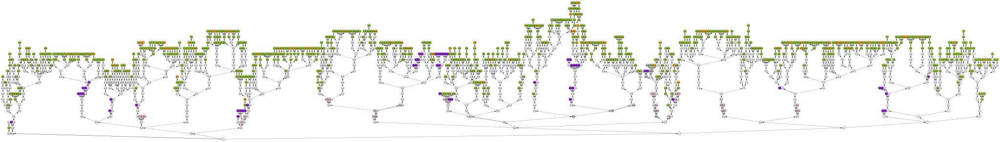

In [7]:
with resources.path('vmlab.data.trees', 'tree_E13_completed.csv') as path:
    tree = pd.read_csv(path)
    graph = vmlab.to_graph(tree)
vmlab.plot_graph(graph, 7000,1000)

## Photosynthesis intensity (leaf number * light fraction) :

In [8]:
tree["environment_id"][pd.isna(tree["environment_id"])] = "mean"
tree['photo_intensity'] = tree['growth__nb_leaf'] * np.array(sunlit_fraction_df_E13[tree['environment_id']])[0]

C:\Users\bolot\AppData\Local\Temp\ipykernel_14940\1355144290.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tree["environment_id"][pd.isna(tree["environment_id"])] = "mean"


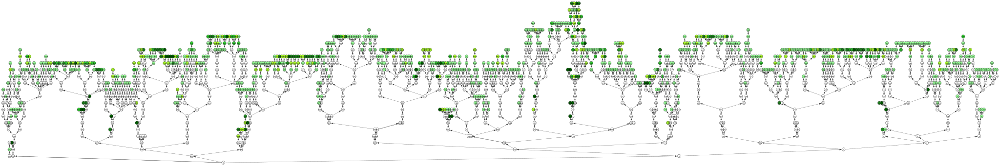

In [9]:
layout = graph.layout_reingold_tilford()
layout.rotate(180)
ig.plot(
    graph, 
    bbox=(0,0,6000,1000), 
    layout=layout, 
    vertex_label=graph.vs.get_attribute_values('id'), #changement ici de 'name' vers 'id'
    vertex_label_size=10,
    vertex_color=['darkgreen' if f>5 else 'forestgreen' if 3<=f<5 else 'limegreen' if 2<=f<3 else 'greenyellow' if 1<=f<2 else 'palegreen' if 0<f<1 else 'white' for f in tree['photo_intensity']]
)

## Weighted graph with GU length in cm on the edges :

In [10]:
graph = vmlab.to_weighted_graph(tree)

layout = graph.layout_reingold_tilford()
layout.rotate(180)
ig.plot(
    graph, 
    bbox=(0,0,9000,1500), 
    layout=layout, 
    edge_label = graph.es['weight'],
    edge_label_size = 8,
    vertex_label=graph.vs.get_attribute_values('id'), #changement ici de 'name' vers 'id'
    vertex_label_size=8.5,
    vertex_color=['purple' if m == "branch" else 'grey' if n == ("multiple_GU" or "undefined")  else 'pink' if o == ("branch_empty" or "scaffold_empty") else 'orange' if f > 0 else 'yellowgreen' if l > 0 else 'white' for f, l,m,n,o in zip(
    graph.vs.get_attribute_values('arch_dev__pot_nb_fruit'),
    graph.vs.get_attribute_values('growth__nb_leaf'),
    graph.vs.get_attribute_values('type'),
    graph.vs.get_attribute_values('type'),
    graph.vs.get_attribute_values('type')
    )])

## Tree 3D structure :

In [11]:
setup = vmlab.create_setup(
    model=visual_model,
    tree=tree,
    start_date='2002-06-01',
    end_date='2002-06-02',
    setup_toml='visual_model.toml',
    current_cycle=3,
    input_vars={
        'growth__leaf_senescence_enabled': False,
        'geometry__interpretation_freq': 1
    },
    output_vars={
    }
)

In [12]:
ds_out = vmlab.run(setup, visual_model, geometry=True)

SceneWidget(scenes=[{'id': 'r0feyQqLQ5OUCaKDsa9WKr558', 'data': b'x\xdaSLrw\xf5\xf7e`Pp\xe0\xe5RPVVd\x00\x020\…

             0% | initialize 

KeyboardInterrupt: 

# TREE G3

## Classic graph showing fruits and leaves location :

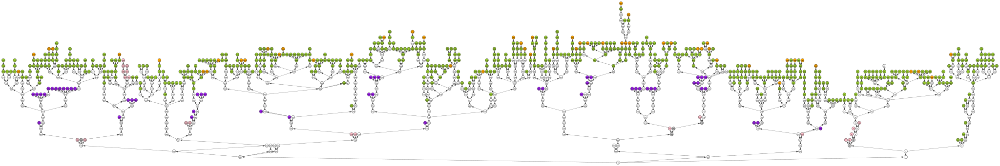

In [40]:
with resources.path('vmlab.data.trees', 'tree_G3_completed.csv') as path:
    tree = pd.read_csv(path)
    graph = vmlab.to_graph(tree)
vmlab.plot_graph(graph, 6000,1000)

## Photosynthesis intensity (leaf number * light fraction) :

In [41]:
tree["environment_id"][pd.isna(tree["environment_id"])] = "mean"
tree['photo_intensity'] = tree['growth__nb_leaf'] * np.array(sunlit_fraction_df_G3[tree['environment_id']])[0]

C:\Users\bolot\AppData\Local\Temp\ipykernel_17816\2068468427.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tree["environment_id"][pd.isna(tree["environment_id"])] = "mean"


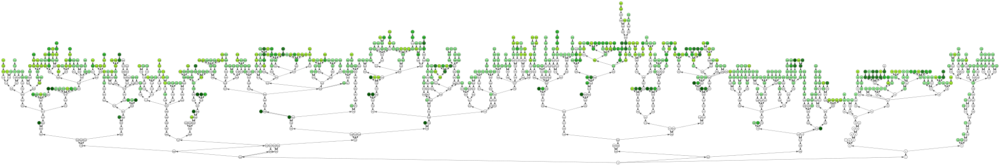

In [42]:
layout = graph.layout_reingold_tilford()
layout.rotate(180)
ig.plot(
    graph, 
    bbox=(0,0,6000,1000), 
    layout=layout, 
    vertex_label=graph.vs.get_attribute_values('id'), #changement ici de 'name' vers 'id'
    vertex_label_size=10,
    vertex_color=['darkgreen' if f>5 else 'forestgreen' if 3<=f<5 else 'limegreen' if 2<=f<3 else 'greenyellow' if 1<=f<2 else 'palegreen' if 0<f<1 else 'white' for f in tree['photo_intensity']]
)

## Weighted graph with GU length in cm on the edges :

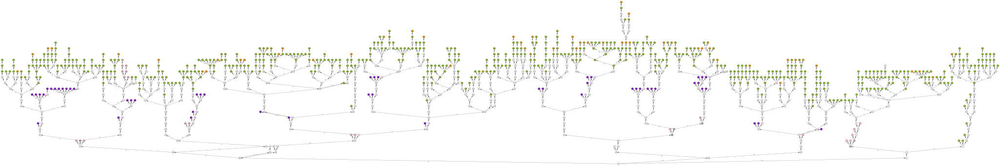

In [43]:
graph = vmlab.to_weighted_graph(tree)

layout = graph.layout_reingold_tilford()
layout.rotate(180)
ig.plot(
    graph, 
    bbox=(0,0,9000,1500), 
    layout=layout, 
    edge_label = graph.es['weight'],
    edge_label_size = 8,
    vertex_label=graph.vs.get_attribute_values('id'), #changement ici de 'name' vers 'id'
    vertex_label_size=8.5,
    vertex_color=['purple' if m == "branch" else 'grey' if n == ("multiple_GU" or "undefined")  else 'pink' if o == ("branch_empty" or "scaffold_empty") else 'orange' if f > 0 else 'yellowgreen' if l > 0 else 'white' for f, l,m,n,o in zip(
    graph.vs.get_attribute_values('arch_dev__pot_nb_fruit'),
    graph.vs.get_attribute_values('growth__nb_leaf'),
    graph.vs.get_attribute_values('type'),
    graph.vs.get_attribute_values('type'),
    graph.vs.get_attribute_values('type')
    )])

## Tree 3D structure :

In [44]:
setup = vmlab.create_setup(
    model=visual_model,
    tree=tree,
    start_date='2002-06-01',
    end_date='2002-06-02',
    setup_toml='visual_model.toml',
    current_cycle=3,
    input_vars={
        'growth__leaf_senescence_enabled': False,
        'geometry__interpretation_freq': 1
    },
    output_vars={
    }
)

In [45]:
ds_out = vmlab.run(setup, visual_model, geometry=True)

SceneWidget(scenes=[{'id': 'D1OCyZgDM30wkaI6TnSS2CJ7D', 'data': b'x\xdaSLrw\xf5\xf7e`Pp\xe0\xe5RPVVd\x00\x020\…

             0% | initialize 

d:\Mes Programmes\miniconda3\envs\vmango-lab\lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


# TREE E16

## Classic graph showing fruits and leaves location :

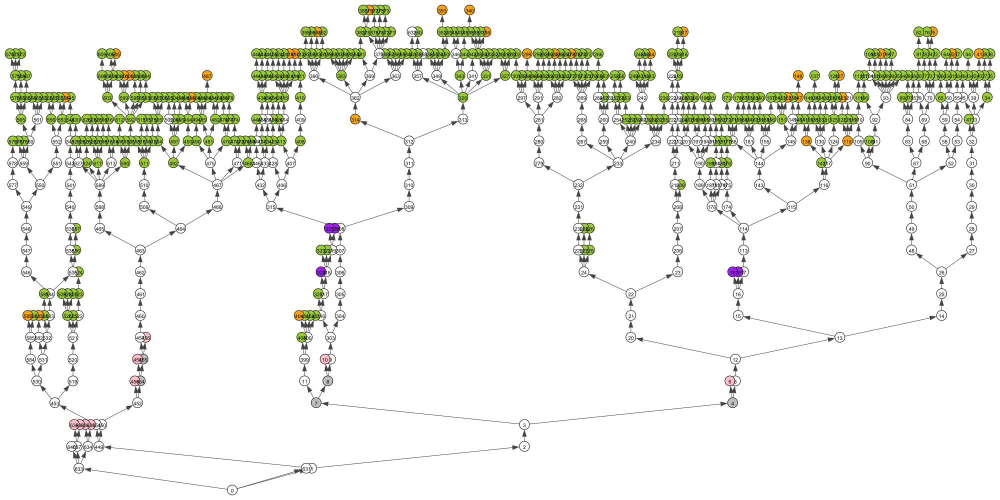

In [46]:
with resources.path('vmlab.data.trees', 'tree_E16_completed.csv') as path:
    tree = pd.read_csv(path)
    graph = vmlab.to_graph(tree)
vmlab.plot_graph(graph, 2000,1000)

## Photosynthesis intensity (leaf number * light fraction) :

In [47]:
tree["environment_id"][pd.isna(tree["environment_id"])] = "mean"
tree['environment_id'][tree['environment_id']=='E16_14A']= 'mean'
tree['photo_intensity'] = tree['growth__nb_leaf'] * np.array(sunlit_fraction_df_E16[tree['environment_id']])[0]

C:\Users\bolot\AppData\Local\Temp\ipykernel_17816\889452002.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tree["environment_id"][pd.isna(tree["environment_id"])] = "mean"
C:\Users\bolot\AppData\Local\Temp\ipykernel_17816\889452002.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tree['environment_id'][tree['environment_id']=='E16_14A']= 'mean'


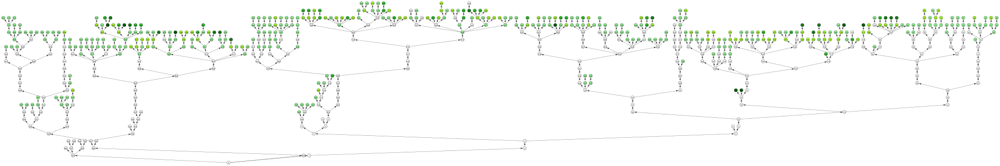

In [48]:
layout = graph.layout_reingold_tilford()
layout.rotate(180)
ig.plot(
    graph, 
    bbox=(0,0,6000,1000), 
    layout=layout, 
    vertex_label=graph.vs.get_attribute_values('id'), #changement ici de 'name' vers 'id'
    vertex_label_size=10,
    vertex_color=['darkgreen' if f>5 else 'forestgreen' if 3<=f<5 else 'limegreen' if 2<=f<3 else 'greenyellow' if 1<=f<2 else 'palegreen' if 0<f<1 else 'white' for f in tree['photo_intensity']]
)

## Weighted graph with GU length in cm on the edges :

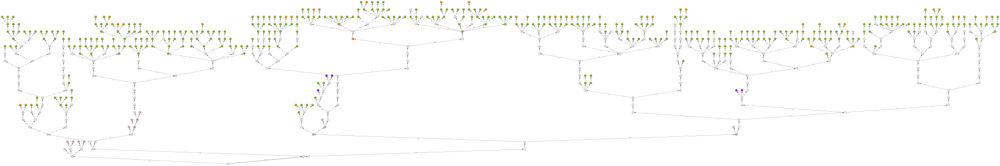

In [49]:
graph = vmlab.to_weighted_graph(tree)

layout = graph.layout_reingold_tilford()
layout.rotate(180)
ig.plot(
    graph, 
    bbox=(0,0,9000,1500), 
    layout=layout, 
    edge_label = graph.es['weight'],
    edge_label_size = 8,
    vertex_label=graph.vs.get_attribute_values('id'), #changement ici de 'name' vers 'id'
    vertex_label_size=8.5,
    vertex_color=['purple' if m == "branch" else 'grey' if n == ("multiple_GU" or "undefined")  else 'pink' if o == ("branch_empty" or "scaffold_empty") else 'orange' if f > 0 else 'yellowgreen' if l > 0 else 'white' for f, l,m,n,o in zip(
    graph.vs.get_attribute_values('arch_dev__pot_nb_fruit'),
    graph.vs.get_attribute_values('growth__nb_leaf'),
    graph.vs.get_attribute_values('type'),
    graph.vs.get_attribute_values('type'),
    graph.vs.get_attribute_values('type')
    )])

## Tree 3D structure :

In [50]:
setup = vmlab.create_setup(
    model=visual_model,
    tree=tree,
    start_date='2002-06-01',
    end_date='2002-06-02',
    setup_toml='visual_model.toml',
    current_cycle=3,
    input_vars={
        'growth__leaf_senescence_enabled': False,
        'geometry__interpretation_freq': 1
    },
    output_vars={
    }
)

In [51]:
ds_out = vmlab.run(setup, visual_model, geometry=True)

SceneWidget(scenes=[{'id': 'gkhkfcue5QK4docWNnyjgTrtL', 'data': b'x\xdaSLrw\xf5\xf7e`Pp\xe0\xe5RPVVd\x00\x020\…

             0% | initialize 

d:\Mes Programmes\miniconda3\envs\vmango-lab\lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


# BONUS : Branches visualisation for the "tree_exploration_topo" notebook

Ploting graph where the GUs counted in "is_in_distance_to_fruit" appear blue.

In [52]:
dmax = 10
with_successors=True
aggregate = True

In [53]:
graph = vmlab.to_graph(tree)
adjacency = np.array(graph.get_adjacency())
GUs = tree.loc[tree.loc[:,'type'] == 'GU']
# GUs = tree.drop(labels = [i for i in tree.loc[:,'id'] if tree.loc[i,'type']!='GU']) # list of all the GU without "branch", "branch_empty"... for when necessary

# Initializaton (setting dtypes)
distance_to_fruit_GU = np.array([], dtype=np.float32)
distance_to_fruit = np.array([], dtype=np.float32)
is_in_distance_to_fruit = np.array([], dtype=bool)
is_in_distance_to_fruit_GU = np.array([], dtype=bool)

is_fruting = tree['arch_dev__pot_nb_fruit'] > 0
is_fruting_and_GU_type = GUs['arch_dev__pot_nb_fruit'] > 0

# Collecting GUs at the chosen distance (with or without successors) from each fruit of the tree :

if np.any(is_fruting_and_GU_type) : 
    distance_to_fruit = csgraph.shortest_path( 
                                adjacency,
                                indices=np.array(GUs[is_fruting_and_GU_type].index),
                                directed=False
                                ).astype(np.float32)
# if np.any(is_fruting) : 
#     distance_to_fruit = csgraph.shortest_path( 
#                                 adjacency,
#                                 indices=np.flatnonzero(is_fruting),
#                                 directed=False
#                                 ).astype(np.float32)

    # including successors :     
    if with_successors :
        distance_to_fruit[distance_to_fruit > dmax] = np.inf 
        is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32)
        

        for fruit in is_in_distance_to_fruit :
            is_a_potential_mother = np.flatnonzero(fruit)
            distance_to_mother = csgraph.shortest_path( 
                                    adjacency,
                                    indices=is_a_potential_mother,
                                    directed=True
                                ).astype(np.float32)    
            belongs_to_mother = np.isfinite(distance_to_mother).astype(np.float32)
            fruit += np.nansum(belongs_to_mother, axis=0)
            
        is_in_distance_to_fruit[is_in_distance_to_fruit!= 0] = 1

    # not including successors :
    else :
        if aggregate :
            distance_to_fruit[distance_to_fruit > dmax] = np.inf # collecting GU at exactly a dmax distance
        else : 
            distance_to_fruit[distance_to_fruit != dmax] = np.inf # collecting GU under a dmax distance
        
        is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32)

        
# Collecting fruity and leafy GUs among the previously selected GUs :
reachable_leaves = np.copy(is_in_distance_to_fruit)
reachable_fruits = np.copy(is_in_distance_to_fruit)
lit_frac = np.copy(is_in_distance_to_fruit)
# Taking into account the fact that some leaves share their carbon production between several fruits :

if with_successors :
    leaf_fruit_sharing_number = np.nansum(np.transpose( 
    np.multiply(
        np.transpose(is_in_distance_to_fruit),                                                # GU bearing fruits to take into account
        np.array(GUs.loc[np.array(GUs[is_fruting_and_GU_type].index), 'arch_dev__pot_nb_fruit']) # number of fruits on these GUs                                                 
        )),
    axis=0)
    
else :    
    leaf_fruit_sharing_number = np.nansum(np.transpose( 
    np.multiply(
        np.transpose(is_in_distance_to_fruit),                                                # GU bearing fruits to take into account
        np.array(GUs.loc[np.array(GUs[is_fruting_and_GU_type].index), 'arch_dev__pot_nb_fruit']) # number of fruits on these GUs                                                 
        )),
    axis=0)

leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_number 
leaf_fruit_sharing_fraction[leaf_fruit_sharing_fraction==np.inf] = 0 

In [54]:
color = pd.DataFrame(is_in_distance_to_fruit, index = np.array(GUs[is_fruting_and_GU_type].index))
chosen_fruit = 288 #among color.index

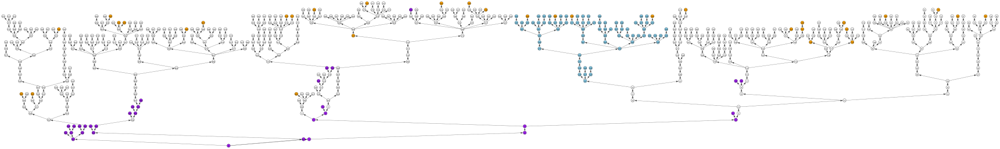

In [55]:
layout = graph.layout_reingold_tilford()
layout.rotate(180)
ig.plot(
    graph, 
    bbox=(0,0,6000,900), 
    layout=layout, 
    vertex_label=graph.vs.get_attribute_values('id'),
    vertex_label_size=10,
    vertex_color=['purple' if GU_type!='GU' else 'orange' if fruit>0 else 'skyblue' if color.loc[chosen_fruit,gu]!=0  else 'white' for GU_type,fruit,gu in zip(
        graph.vs.get_attribute_values('type'),
        graph.vs.get_attribute_values('arch_dev__pot_nb_fruit'),
        graph.vs.get_attribute_values('id'))
    ])

In [56]:
liste = np.array(color.loc[353, color.loc[353]==1].index)
tree.loc[liste]

,id,type,parent_id,scaffold_id,topology__is_apical,arch_dev__pot_flowering_date,arch_dev__pot_nb_inflo,arch_dev__pot_nb_fruit,growth__nb_leaf,growth__radius_gu,appearance__final_length_gu,environment_id,light_interception__sunlit_fraction_col,photo_intensity
308,308,GU,307.0,2.0,1.0,NAT,NaN,NaN,0,2.146473,12,mean,3.0,0.000000
309,309,GU,308.0,2.0,1.0,NAT,NaN,NaN,0,2.101289,13,mean,3.0,0.000000
310,310,GU,309.0,2.0,1.0,NAT,NaN,NaN,0,2.021594,11,mean,3.0,0.000000
311,311,GU,310.0,2.0,1.0,NAT,NaN,NaN,0,1.944420,13,mean,3.0,0.000000
312,312,GU,311.0,2.0,1.0,NAT,NaN,NaN,0,1.869668,13,mean,3.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,445,GU,444.0,2.0,1.0,NAT,NaN,NaN,7,0.194000,6,E16_11D,3.0,0.882219
446,446,GU,432.0,2.0,0.0,NAT,NaN,NaN,0,0.303949,5,mean,3.0,0.000000
447,447,GU,446.0,2.0,0.0,NAT,NaN,NaN,0,0.244686,3,mean,3.0,0.000000
448,448,GU,447.0,2.0,1.0,NAT,NaN,NaN,2,0.172000,5,E16_11E,3.0,0.147896


# BONUS BIS : mass variability on one GU

In [13]:
with resources.path('vmlab.data.fruit_quality', 'fruits_masses.csv') as path:
    fruit_mass = pd.read_csv(path,
                             sep=";",
                             usecols=['id_UC', 'arbre', 'id_branche','id_fruit', 'MS_ini', 'MF_rec'],
                            )
fruit_mass.index=fruit_mass['id_UC']
fruit_mass.index = fruit_mass['arbre']
fruit_mass.drop(columns = ['arbre'], inplace=True)
fruit_mass = fruit_mass[fruit_mass['id_UC'].notna()]

fruit_mass

,id_branche,id_fruit,id_UC,MS_ini,MF_rec
arbre,,,,,
E13,1.0,1,155.0,13.099752,484.21
E13,2.0,2,203.0,11.464581,464.97
E13,2.0,a,193.0,NaN,479.00
E13,2.0,b,134.0,NaN,456.00
E13,2.0,c,134.0,NaN,332.00
...,...,...,...,...,...
G3,35.0,d,1073.0,NaN,144.00
G3,36.0,36,930.0,5.418767,481.10
G3,36.0,a,930.0,NaN,326.00


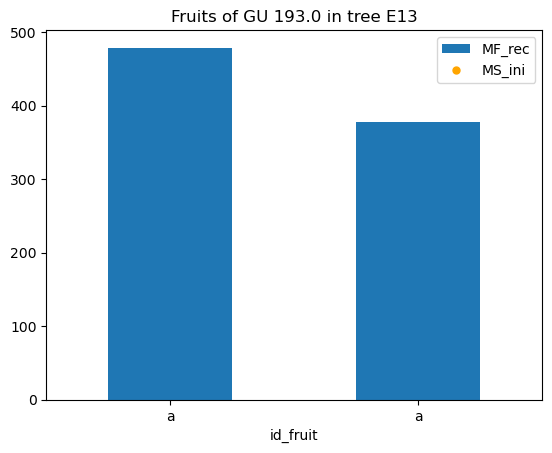

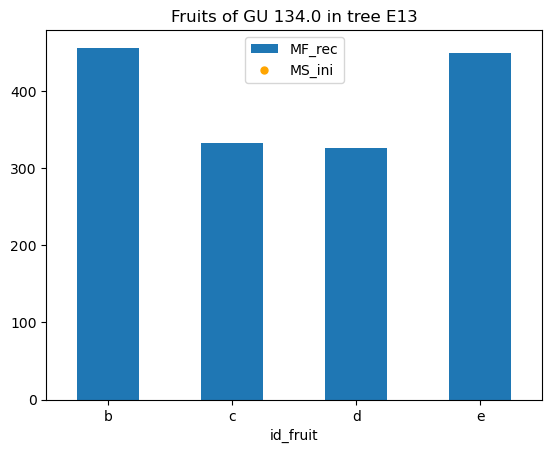

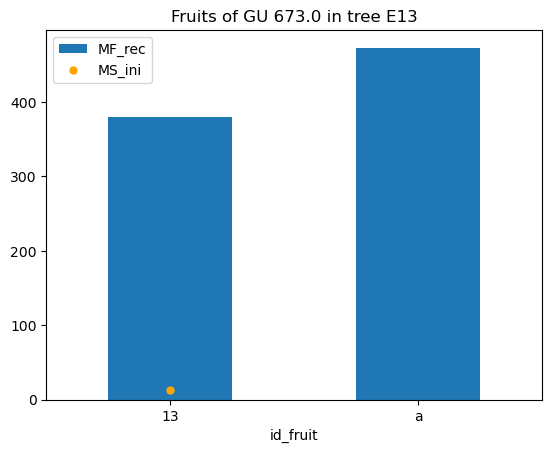

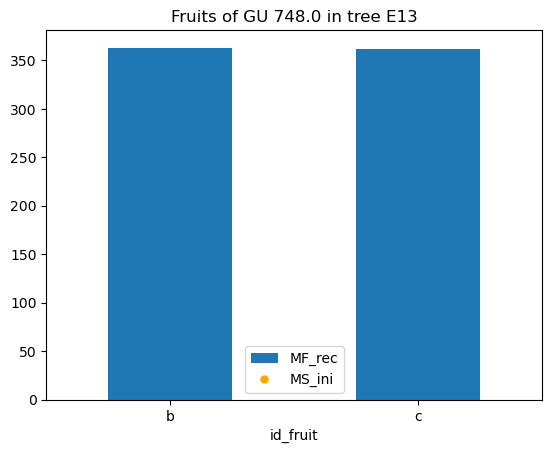

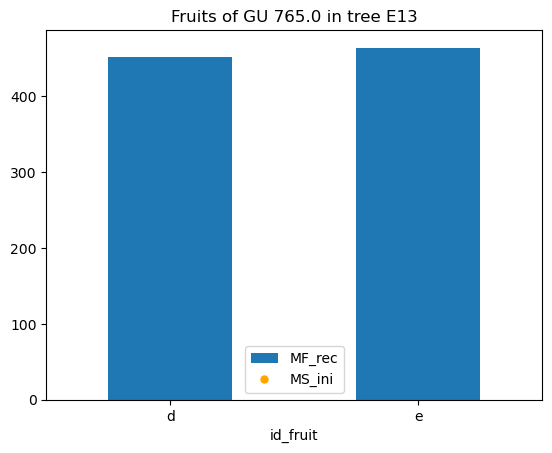

...

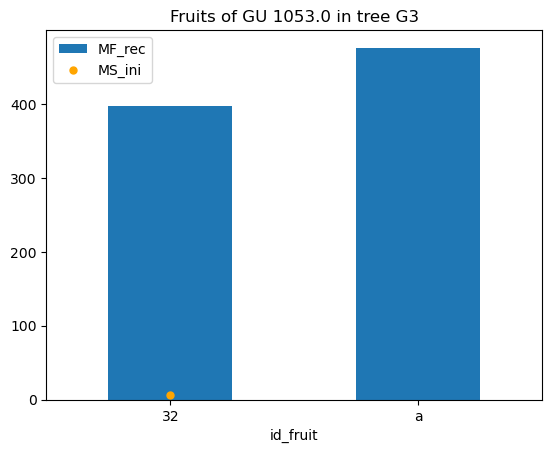

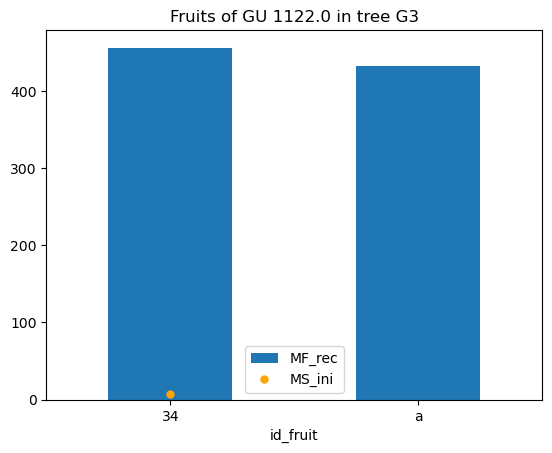

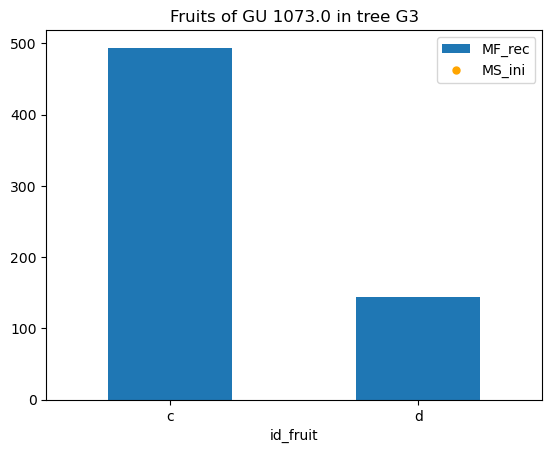

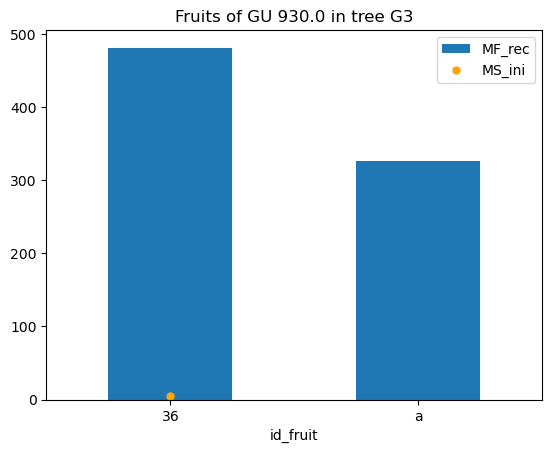

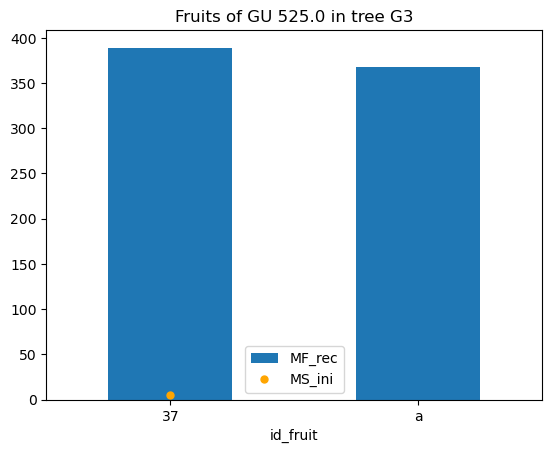

In [24]:
for tree in ['E13','E16', 'G3'] : 
    seen=[]
    sample = fruit_mass[fruit_mass.index == tree]
    for i in sample['id_UC'] :
        if i not in seen and len(sample[sample['id_UC'] == i])>1 :
            GU = sample[sample['id_UC'] == i]
            ax = GU.plot(x='id_fruit', y='MF_rec', kind = 'bar',
                        title = 'Fruits of GU '+str(i)+' in tree '+tree)
            GU.plot(x='id_fruit', y='MS_ini', linestyle="", marker=".", color='orange', markersize=10, ax=ax)
            seen.append(i)
        plt.show()